<a href="https://colab.research.google.com/github/yuvalofek/Digital-Image-Processing/blob/main/OpenCVTutorial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Walking through an OpenCV tutorial
[tutorial link](https://www.youtube.com/watch?v=WQeoO7MI0Bs&ab_channel=Murtaza%27sWorkshop-RoboticsandAI)


I tried to go through the basic operations, which were at the beginning as opposed to some of the more complicated (such as face detection) which is done in the latter parts of the tutorial. 

In [ ]:
import cv2 
import numpy as np
#collab patch for imshow:
from google.colab.patches import cv2_imshow as imshow
DIR = '/content/drive/MyDrive/DIP/'
IMG = 'PaprikaMovie.jpg'

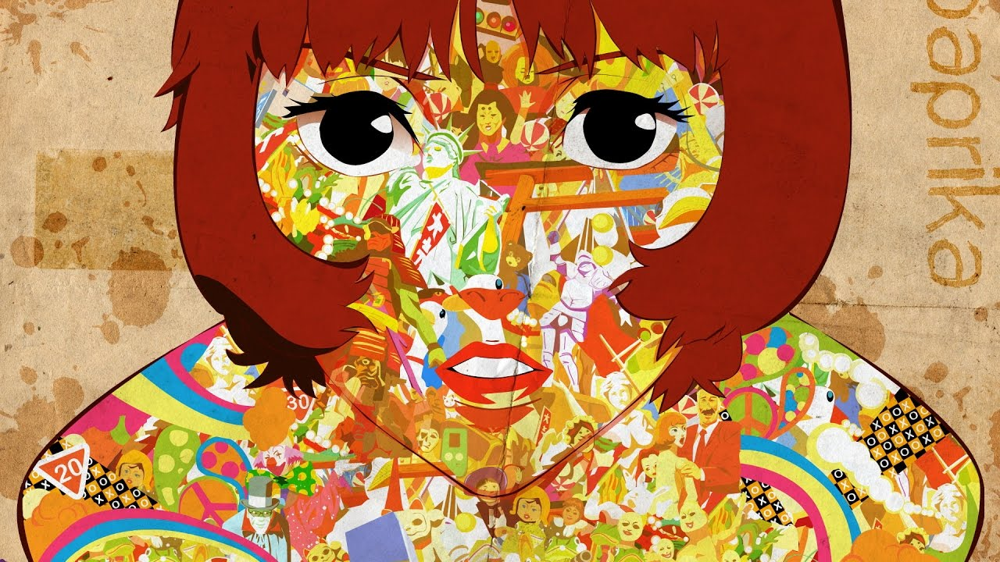

In [ ]:
img = cv2.imread(DIR+IMG)

#Show image
imshow(img)

In [ ]:
#Video capture is a bit odd on colab so I skipped it 
#There is a snipppet that does it for us too

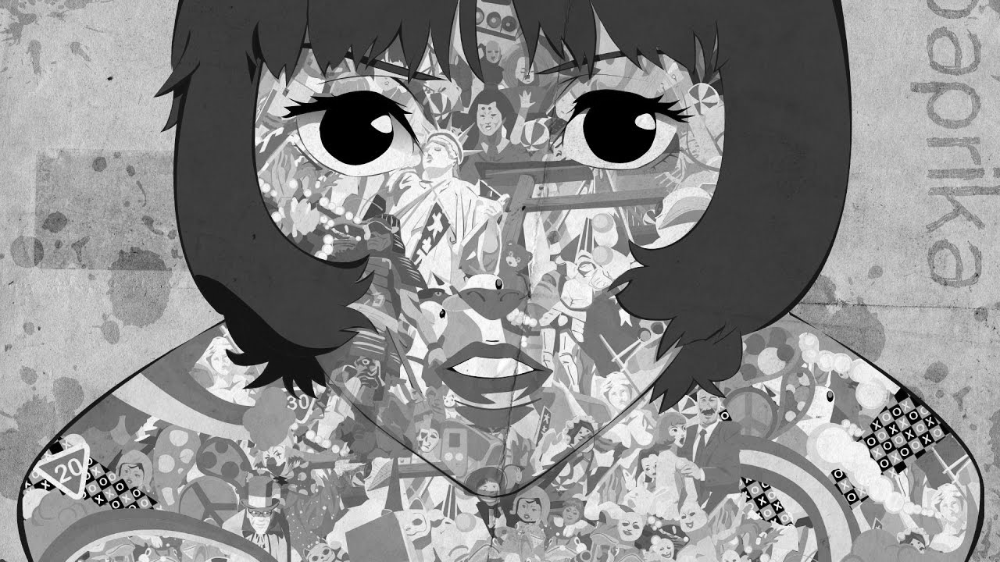

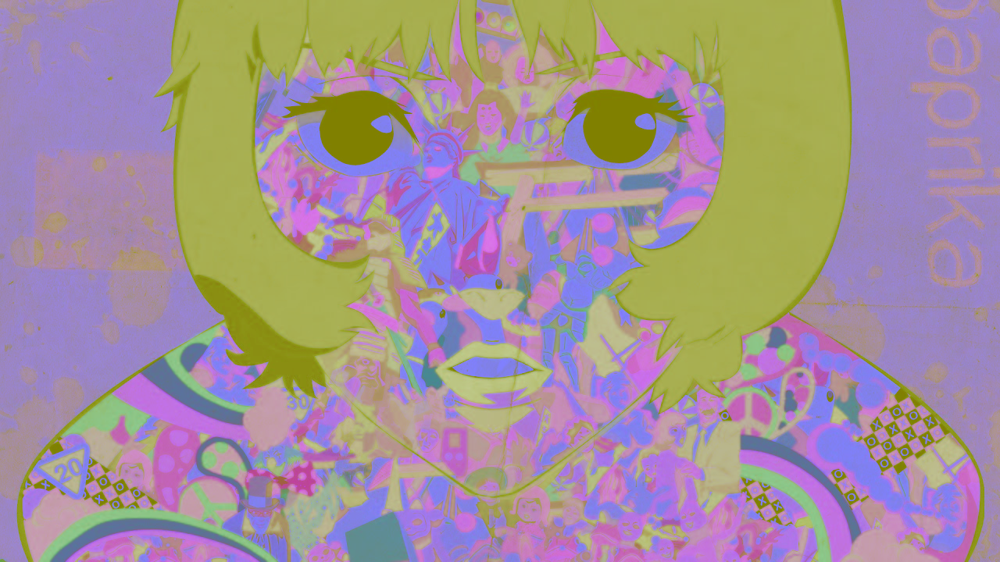

In [ ]:
#Change color schemes
imgGray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
imshow(imgGray)


imlab = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)
imshow(imlab)

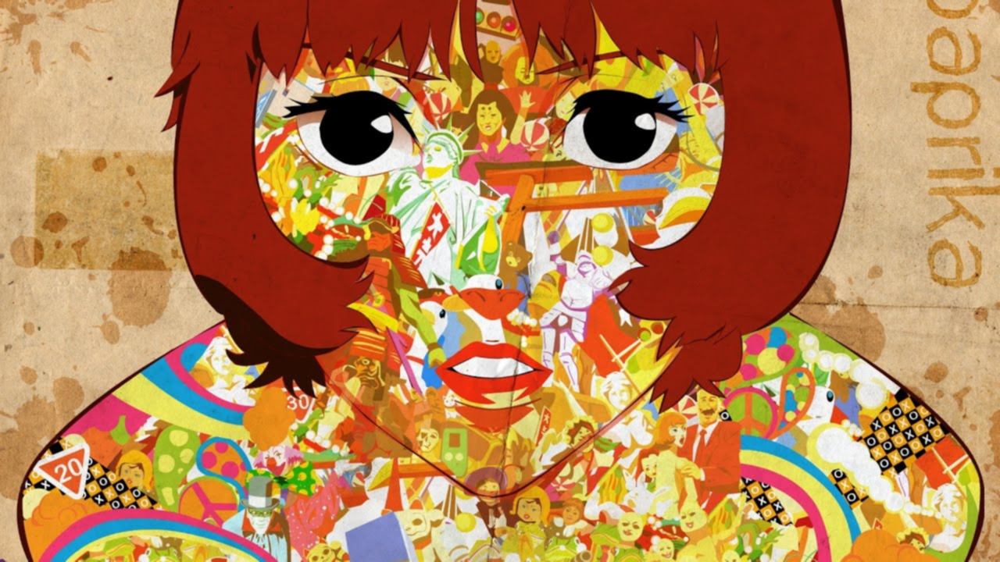

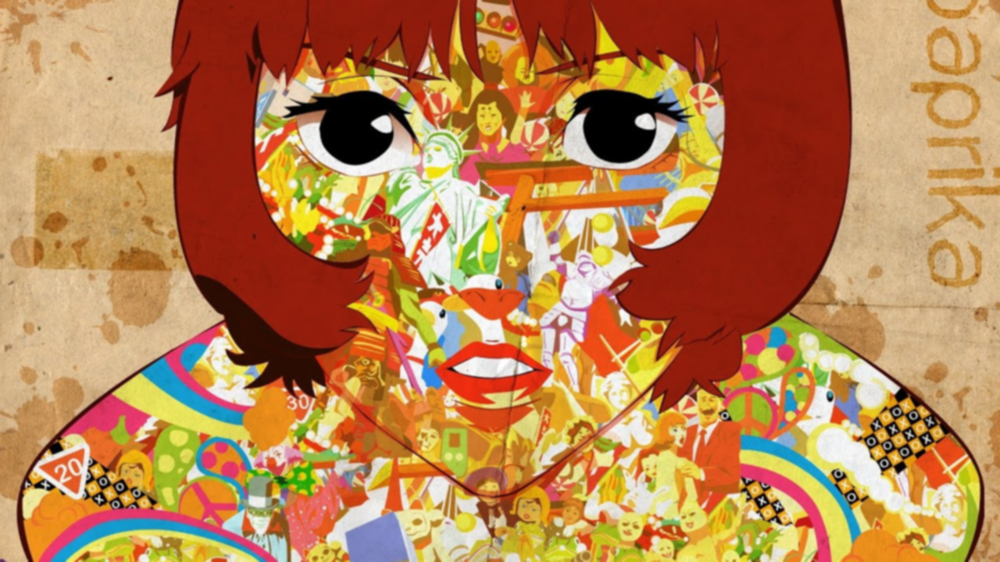

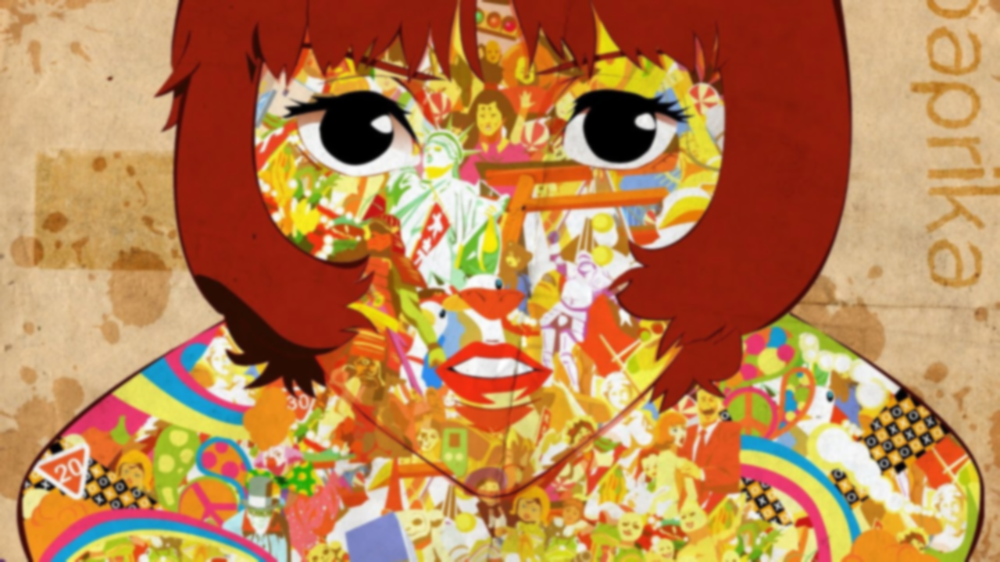

In [ ]:
#blur
def bluring(img, kernel_size):
  imblur = cv2.GaussianBlur(img, (kernel_size,kernel_size), 0)
  imshow(imblur)

bluring(img, 3)
bluring(img, 5)
bluring(img, 9)


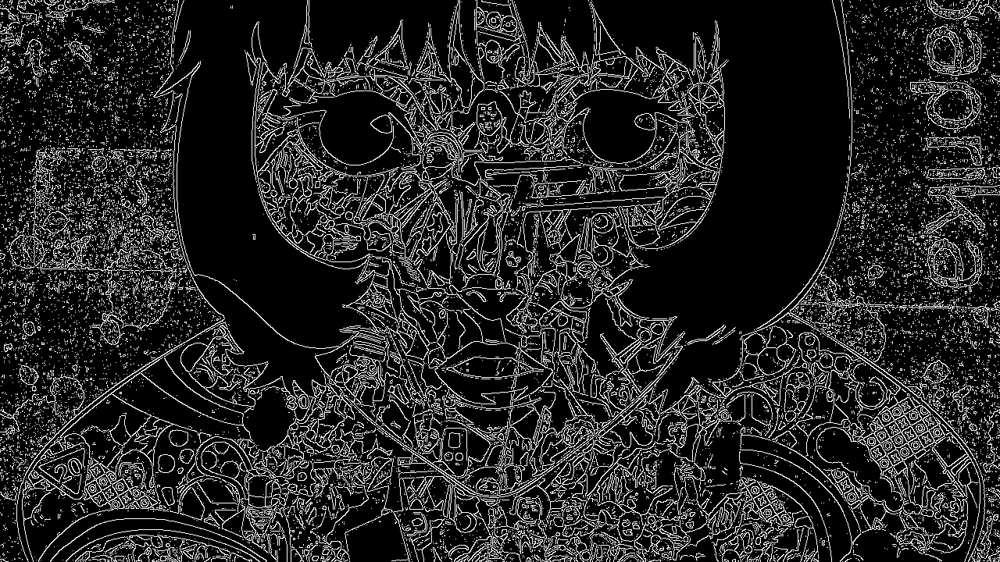

In [ ]:
#canny
imcanny = cv2.Canny(img, 100, 100)
imshow(imcanny)

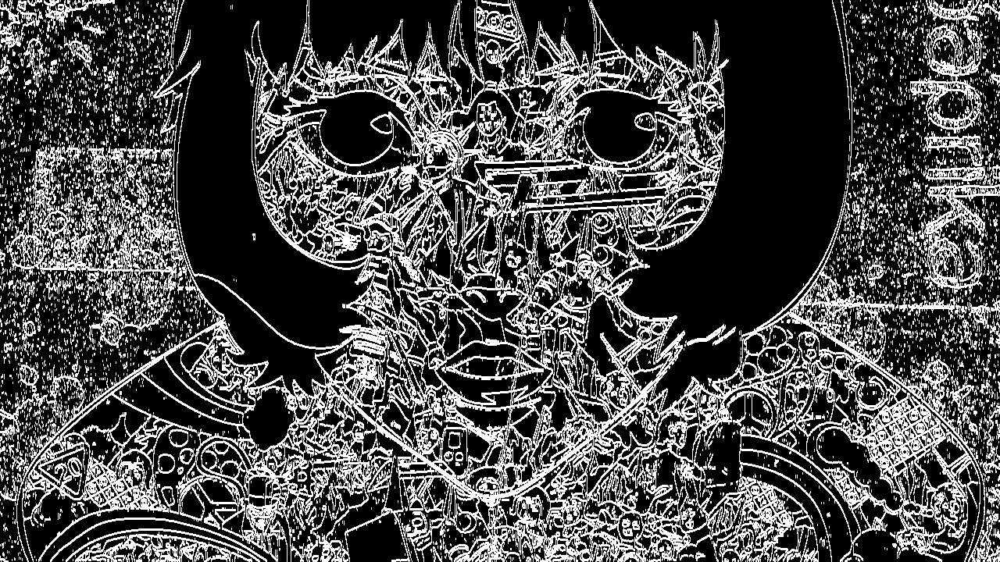

In [ ]:
#dialeted edges
ker = np.ones(3)
imgdial = cv2.dilate(imcanny, ker, iterations = 1)
imshow(imgdial)

original image size: (720, 1280, 3)


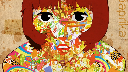

resized image size: (72, 128, 3)


In [ ]:
#resize image 
print('original image size:', img.shape)
imresize = cv2.resize(img, (128, 72))
imshow(imresize)
print('resized image size:', imresize.shape)

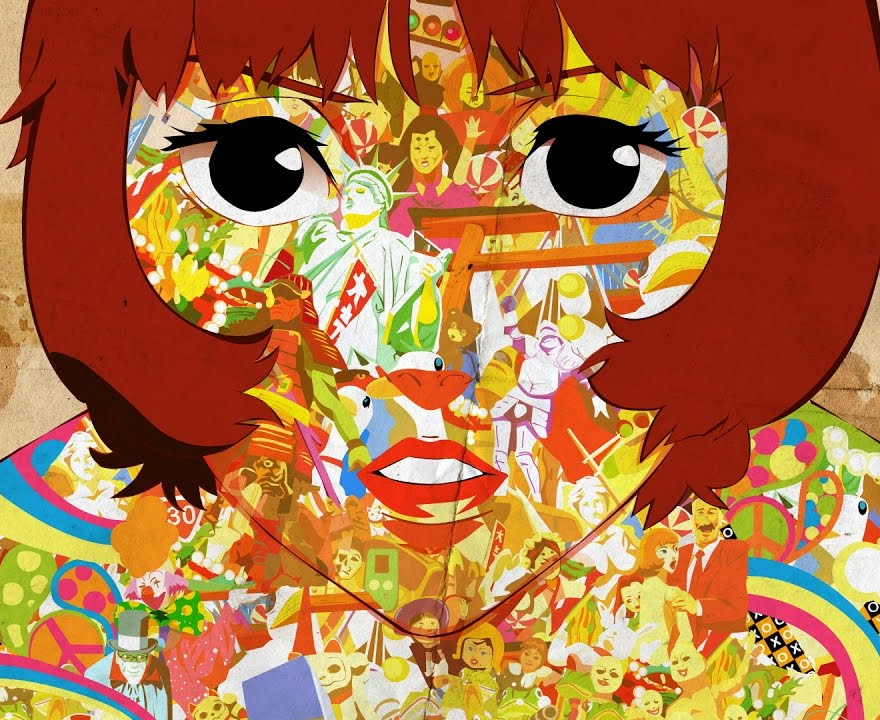

In [ ]:
#cropping
imcrop = img[0:720, 200:-200]
imshow(imcrop)

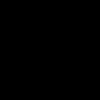

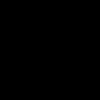

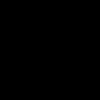

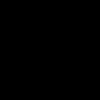

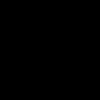

In [ ]:
#Checking the effect of datatypes on printing

imgz = np.zeros((100, 100))
imshow(imgz)
print('')
imgz = np.zeros((100, 100), np.uint)
imshow(imgz)
print('')
imgz = np.zeros((100, 100), np.int)
imshow(imgz)
print('')
imgz = np.zeros((100, 100), np.longlong)
imshow(imgz)
print('')
imgz = np.zeros((100, 100), np.double)
imshow(imgz)

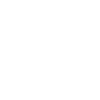

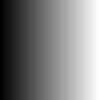

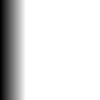

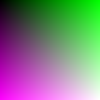

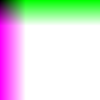

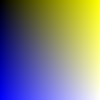

In [ ]:
#Other checks

#really large numbers (greyscale all same)
imgz = np.ones((100, 100))*1e12
imshow(imgz)
print('')
#Greyscale gradient
imgz= np.tile(np.linspace(0,256, 100),(100, 1))
imshow(imgz)
print('')


#Greyscale gradient with overflow
imgz= np.tile(np.linspace(0,1000, 100),(100, 1))
imshow(imgz)
print('')


#normal color changes
imgz= np.transpose(np.tile(np.tile(np.linspace(0,256, 100),(100, 1)),(3,1,1)), (2,1,0))
imgz[:,:,1] = np.transpose(imgz[:,:,1])
imshow(imgz)
print('')

#Color change with overflow
imgz= np.transpose(np.tile(np.tile(np.linspace(0,1000, 100),(100, 1)),(3,1,1)), (2,1,0))
imgz[:,:,1] = np.transpose(imgz[:,:,1])
imshow(imgz)
print('')

#Different color change
imgz= np.transpose(np.tile(np.tile(np.linspace(0,256, 100),(100, 1)),(3,1,1)), (2,1,0))
imgz[:,:,1] = np.transpose(imgz[:,:,1])
imgz[:,:,2] = np.transpose(imgz[:,:,2])

imshow(imgz)

### We see that openCV ens up allowing the overflow, but it caps it (colors are 
# preserved and overflow in one channel has no bearing on the others)

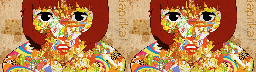

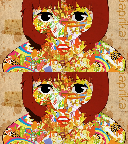

In [ ]:
#stacking

#Horizontal
hor = np.hstack((imresize, imresize))
imshow(hor)
print('')

#Vertical
ver = np.vstack((imresize, imresize))
imshow(ver)


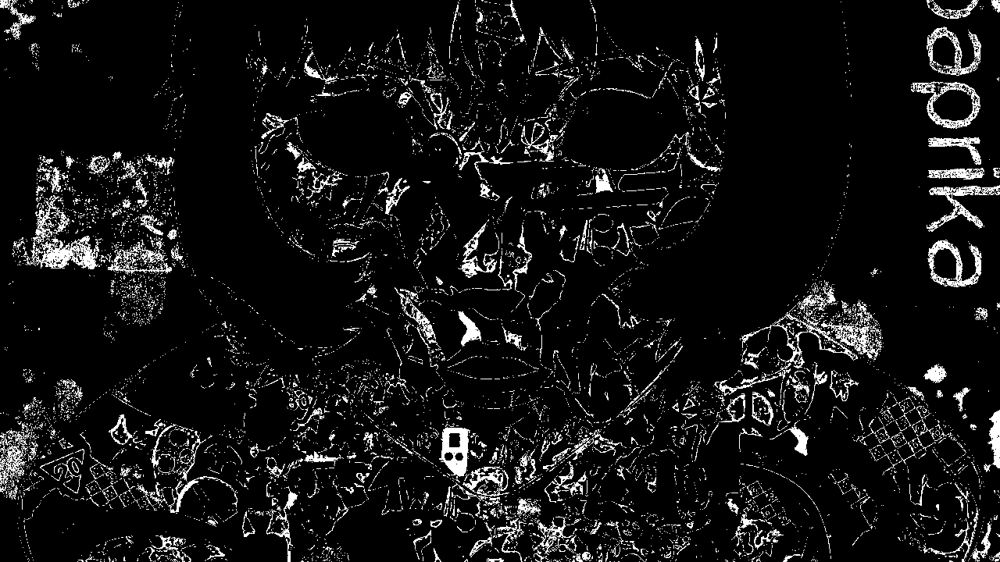

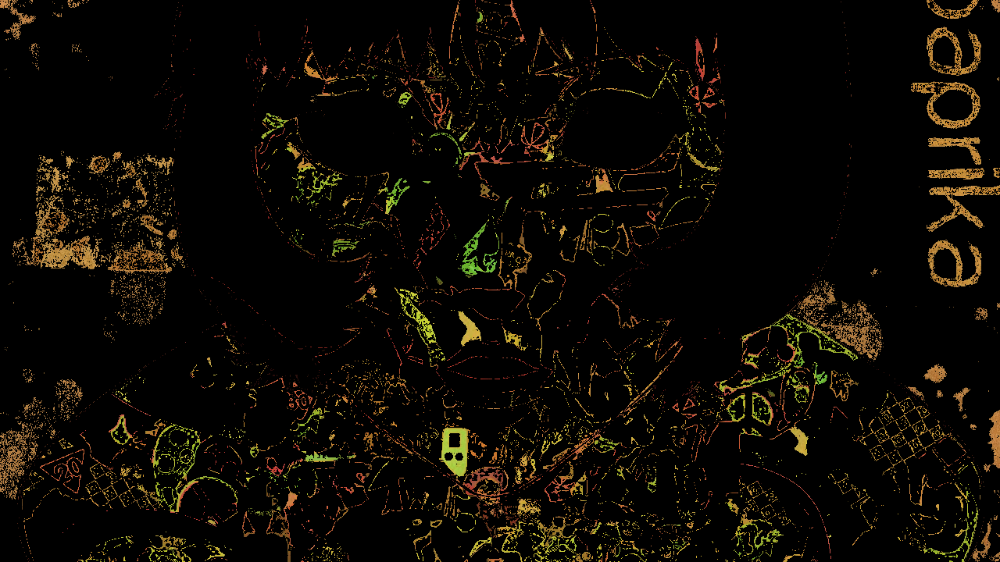

In [ ]:
#Masking based on hsv bounds

imgHSV = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
#Trackbars don't work on collab

#mask parameters
hmin = 0
hmx = 50

smin = 150
smx = 200

vmin = 30
vmx = 215

#create mask
lw = np.array([hmin, smin, vmin])
hgh = np.array([hmx, smx, vmx])
mask = cv2.inRange(imgHSV, lw, hgh)
imshow(mask)

#apply mask
im_masked = cv2.bitwise_and(img,img, mask= mask)
imshow(im_masked)